In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, InputLayer
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:

# Paths to the dataset
image_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/images"
mask_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/masks"

# Image size (resize all images to this size)
IMG_HEIGHT, IMG_WIDTH = 256, 256
NUM_CLASSES = 8  # Define the number of classes in the SUIM dataset (you can modify this)

# Load the images and masks
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    
    image_filenames = os.listdir(image_dir)
    image_filenames = sorted(image_filenames)
    mask_filenames = os.listdir(mask_dir)
    mask_filenames = sorted(mask_filenames)
    for image_filename in image_filenames:
        # Load image
        img = cv2.imread(os.path.join(image_dir, image_filename))
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        images.append(img)
        
    for mask_filename in mask_filenames:
        # Load corresponding mask
        mask = cv2.imread(os.path.join(mask_dir, mask_filename))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        masks.append(mask)
    
    return np.array(images), np.array(masks)


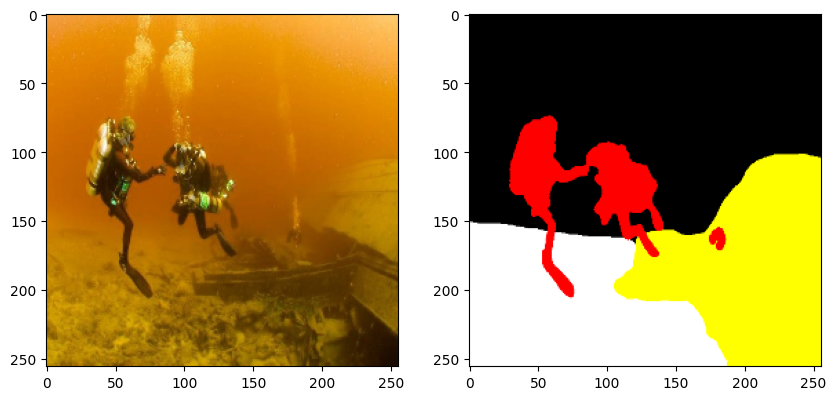

In [4]:
images, masks = load_data(image_dir, mask_dir)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(images[0])
axs[1].imshow(masks[0])
plt.show()

In [5]:
import numpy as np
from PIL import Image
import os

# Define the color-to-class mapping
color_to_class = {
    (0, 0, 0): 0,         # Background (waterbody)
    (0, 0, 255): 1,       # Human divers
    (0, 255, 0): 2,       # Aquatic plants and sea-grass
    (0, 255, 255): 3,     # Wrecks and ruins
    (255, 0, 0): 4,       # Robots (AUVs/ROVs/instruments)
    (255, 0, 255): 5,     # Reefs and invertebrates
    (255, 255, 0): 6,     # Fish and vertebrates
    (255, 255, 255): 7    # Sea-floor and rocks
}

def mask_to_class(mask, color_to_class):
    mask_rgb = np.array(mask)  # Convert mask to a numpy array
    height, width, _ = mask_rgb.shape
    label_mask = np.zeros((height, width, 8), dtype=np.float32)  # Initialize the class label mask with 8 channels

    # Iterate over the color-to-class mapping and assign class ids
    for rgb, class_id in color_to_class.items():
        # Create a mask where the color matches the current RGB tuple
        match = np.all(mask_rgb == rgb, axis=-1)
        label_mask[:, :, class_id] = match.astype(np.float32)  # Assign 1 to the matching pixels in the corresponding channel

    # print(label_mask.shape)
    return label_mask

# Directory to save class masks
output_dir = "/class_masks"
os.makedirs(output_dir, exist_ok=True)
class_masks=[]
# Process all mask images
for i, mask_image in enumerate(masks):
    # Convert the RGB mask to a class index mask
    class_mask = mask_to_class(mask_image, color_to_class)
    class_masks.append(class_mask)

In [6]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, class_masks, test_size=0.2, random_state=42)

# Check the number of samples in each split
print(f"Training samples: {len(X_train)}, Testing samples: {len(X_test)}")

# Now you can use X_train and X_test for training and testing

Training samples: 1220, Testing samples: 305


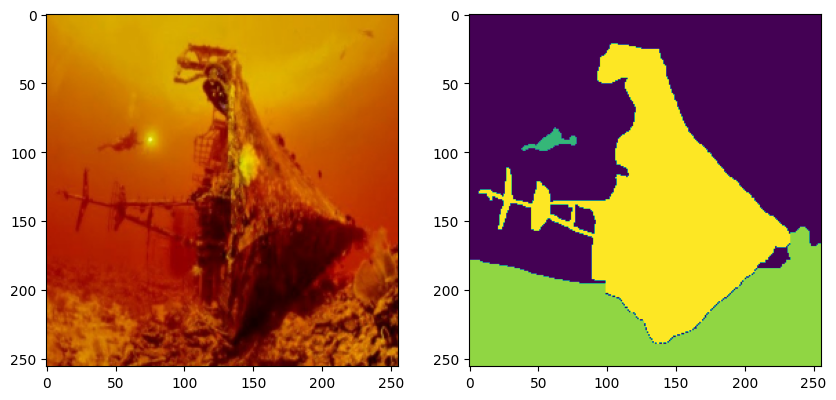

In [7]:
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(X_train[0])
axs[1].imshow(np.argmax(y_train[0],axis=2))
plt.show()

In [8]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

1220
1220
305
305


In [9]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coef

def bce_dice_loss(y_true, y_pred):
    # Binary Crossentropy
    bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    bce = bce_loss(y_true, y_pred)

    # Dice loss
    dice = dice_loss(y_true, y_pred)

    # Combine the losses
    combined_loss = 0.5 * bce + 0.5 * dice
    return combined_loss

In [10]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input,UpSampling2D, Conv2D, BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.layers import add, Lambda, Concatenate, ZeroPadding2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.applications import VGG16


def RSB(input_tensor, kernel_size, filters, strides=1, skip=True):
    """ 
       A residual skip block
    """
    f1, f2, f3, f4 = filters
    ## sub-block1
    x = Conv2D(f1, (1, 1), strides=strides)(input_tensor)    
    x = BatchNormalization(momentum=0.8)(x)
    x = Activation('relu')(x)
    ## sub-block2
    x = Conv2D(f2, kernel_size, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Activation('relu')(x)
    ## sub-block3
    x = Conv2D(f3, (1, 1))(x)
    x = BatchNormalization(momentum=0.8)(x)
    ## skip connetion based on the given choice 
    if skip: 
        shortcut = input_tensor
    else: 
        shortcut = Conv2D(f4, (1, 1), strides=strides)(input_tensor)
        shortcut = BatchNormalization(momentum=0.8)(shortcut)
    ## complete connection and activation
    x = add([x, shortcut])
    x = Activation('relu')(x)
    return x


def Suim_Encoder_RSB(inp_res, channels=1):
    """ 
       SUIM-Net encoder
    """
    im_H, im_W = inp_res
    img_input = Input(shape=(im_H, im_W, channels))
    ## encoder block 1
    x = Conv2D(64, (5, 5), strides=1)(img_input)
    enc_1 = x
    ## encoder block 2
    x = BatchNormalization(momentum=0.8)(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3) , strides=2)(x)
    x = RSB(x, 3, [64, 64, 128, 128], strides=2, skip=False)
    x = RSB(x, 3, [64, 64, 128, 128], skip=True)
    x = RSB(x, 3, [64, 64, 128, 128], skip=True)
    enc_2 = x 
    ## encoder block 3
    x = RSB(x, 3, [128, 128, 256, 256], strides=2, skip=False)
    x = RSB(x, 3, [128, 128, 256, 256], skip=True)
    x = RSB(x, 3, [128, 128, 256, 256], skip=True)
    x = RSB(x, 3, [128, 128, 256, 256], skip=True)
    enc_3 = x 
    ## return
    return img_input, [enc_1 , enc_2 , enc_3]


def Suim_Decoder_RSB(enc_inputs, n_classes):
    """ 
       SUIM-Net decoder
    """
    def concat_skip(layer_input, skip_input, filters, f_size=3):
        # for concatenation of the skip connections from encoders
        u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(layer_input)
        u = BatchNormalization(momentum=0.8)(u)
        u = Concatenate()([u, skip_input])
        return u
    ## decoder block 1
    enc_1 , enc_2 , enc_3 = enc_inputs
    dec_1 = Conv2D(256, (3, 3), padding='same')(enc_3)
    dec_1 = BatchNormalization(momentum=0.8)(dec_1)
    dec_1 = UpSampling2D(size=2)(dec_1)
    # padding for matching dimenstions
    dec_1 = Lambda(lambda x : x[: , :-2 , :-2 , :  ] )(dec_1) # padding
    dec_1 = ZeroPadding2D((1,1))(dec_1)
    enc_2 = Lambda(lambda x : x[: , :-1 , :-1 , :  ] )(enc_2) # padding
    enc_2 = ZeroPadding2D((1,1))(enc_2)
    dec_1s = concat_skip(enc_2, dec_1, 256)
    ## decoder block 2
    dec_2 = Conv2D(256, (3, 3), strides=1, padding='same')(dec_1s)
    dec_2 = BatchNormalization(momentum=0.8)(dec_2)
    dec_2 = UpSampling2D(size=2)(dec_2)
    dec_2s = Conv2D(128, (3, 3), strides=1, padding='same')(dec_2)
    dec_2s = BatchNormalization(momentum=0.8)(dec_2s)
    dec_2s = UpSampling2D(size=2)(dec_2s)
    # padding for matching dimenstions
    enc_1 = ZeroPadding2D((2,2))(enc_1)
    dec_2s = concat_skip(enc_1, dec_2s, 128)
    ## decoder block 3
    dec_3 = Conv2D(128, (3, 3), padding='same')(dec_2s)
    dec_3 = BatchNormalization()(dec_3)
    dec_3s = Conv2D(64, (3, 3), padding='same')(dec_3)
    dec_3s = BatchNormalization(momentum=0.8)(dec_3s)
    ## return output layer
    out = Conv2D(n_classes, (3, 3), padding='same', activation='sigmoid')(dec_3s) 
    return out

def myUpSample2X(layer_input, skip_input, filters, f_size=3):
    ## for upsampling
    u = UpSampling2D(size=2)(layer_input)
    u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
    u = BatchNormalization(momentum=0.8)(u)
    u = Concatenate()([u, skip_input])
    return u



class SUIM_Net():
    """ 
       The SUIM-Net model (Fig. 5 in the paper)
        - base = 'RSB' for RSB-based encoder (Fig. 5b)
        - base = 'VGG' for 12-layer VGG-16 encoder (Fig. 5c)
    """
    def __init__(self, base='RSB', im_res=(320, 240, 3), n_classes=8):
        self.lr0 = 1e-4 
        self.inp_shape = (im_res[1], im_res[0])
        self.img_shape = (im_res[1], im_res[0], 3)
        if base=='RSB':
            self.model = self.get_model_RSB(n_classes)
            self.model.compile(optimizer = Adam(), 
                               loss = 'binary_crossentropy', 
                               metrics = ['accuracy'])
        elif base=='VGG': 
            self.model = self.get_model_VGG16(n_classes)
            self.model.compile(optimizer = Adam(), 
                               loss = 'binary_crossentropy', 
                               metrics = ['accuracy'])

    def get_model_RSB(self, n_classes):
        img_input, features = Suim_Encoder_RSB(self.inp_shape, channels=3)
        out = Suim_Decoder_RSB(features, n_classes) 
        return Model(input=img_input, output=out)

    def get_model_VGG16(self, n_classes):
        vgg = VGG16(input_shape=self.img_shape, include_top=False, weights='imagenet')
        vgg.trainable = True
        for layer in vgg.layers:
            layer.trainable = True
        # encoder
        pool1 = vgg.get_layer('block1_pool').output
        pool2 = vgg.get_layer('block2_pool').output
        pool3 = vgg.get_layer('block3_pool').output
        pool4 = vgg.get_layer('block4_pool').output
        ## decoder
        dec1 = myUpSample2X(pool4, pool3, 512)
        dec2 = myUpSample2X(dec1, pool2, 256)
        dec3 = myUpSample2X(dec2, pool1, 128)
        dec4 = UpSampling2D(size=2)(dec3)
        ## return output layer
        out = Conv2D(n_classes, (3, 3), padding='same', activation='sigmoid', name='output')(dec4)
        return Model(vgg.input, out)

model = SUIM_Net('VGG', im_res=(256, 256, 3))
print (model.model.summary())


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 256, 256,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 128, 128,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 128, 128,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 128, 128,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 64, 64,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 64, 64,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 64, 64,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 64, 64,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 32, 32,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 32, 32,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 32, 32,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 32, 32,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 16, 16,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ block4_pool[0][0] │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 32, 32,    │  2,359,808 │ up_sampling2d[0]

 Total params: 12,224,712 (46.63 MB)

 Trainable params: 12,222,920 (46.63 MB)

 Non-trainable params: 1,792 (7.00 KB)

None


In [11]:
y_train = np.array(y_train).reshape((1220, 256, 256, 8))

In [12]:
y_test =np.array(y_test).reshape((305, 256, 256, 8))

In [13]:
# Train the model
# print(X_train.shape,y_train.shape)
history = model.model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/50


I0000 00:00:1729155379.851730      98 service.cc:145] XLA service 0x7c449801d230 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729155379.851800      98 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1729155409.423362      98 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


77/77 ━━━━━━━━━━━━━━━━━━━━ 72s 484ms/step - accuracy: 0.4293 - loss: 18.3425 - val_accuracy: 0.4525 - val_loss: 2.6153
Epoch 2/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - accuracy: 0.4647 - loss: 2.2670 - val_accuracy: 0.5597 - val_loss: 1.2152
Epoch 3/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - accuracy: 0.4990 - loss: 1.1481 - val_accuracy: 0.5429 - val_loss: 1.2061
Epoch 4/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - accuracy: 0.5312 - loss: 0.8148 - val_accuracy: 0.3737 - val_loss: 0.8070
Epoch 5/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 279ms/step - accuracy: 0.5062 - loss: 0.6563 - val_accuracy: 0.5721 - val_loss: 0.8163
Epoch 6/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 279ms/step - accuracy: 0.5531 - loss: 0.4700 - val_accuracy: 0.5954 - val_loss: 0.5444
Epoch 7/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - accuracy: 0.5618 - loss: 0.3915 - val_accuracy: 0.5756 - val_loss: 0.4182
Epoch 8/50
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 279ms/step - accuracy: 0.5784 - loss: 0.3500 - val_accuracy: 0.60

10/10 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.7154 - loss: 0.1815 
Test Accuracy: 0.7043
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 203ms/step


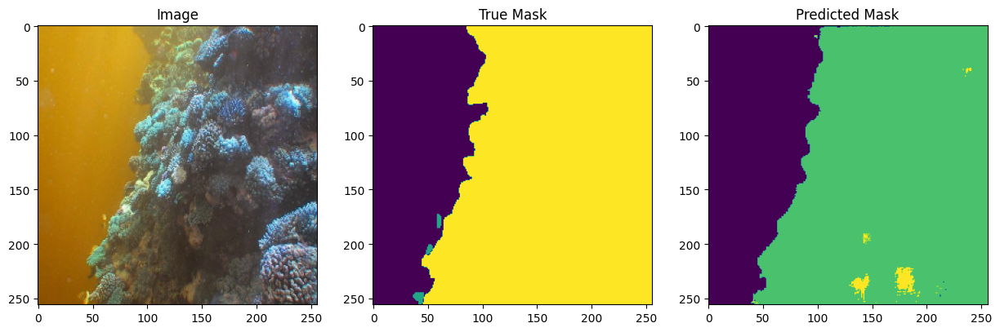

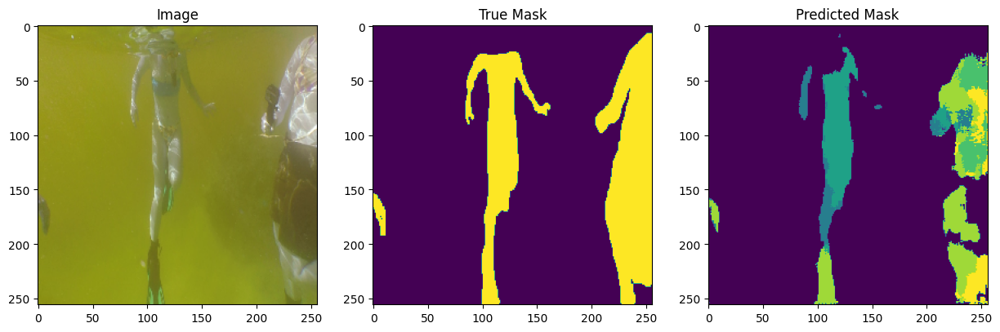

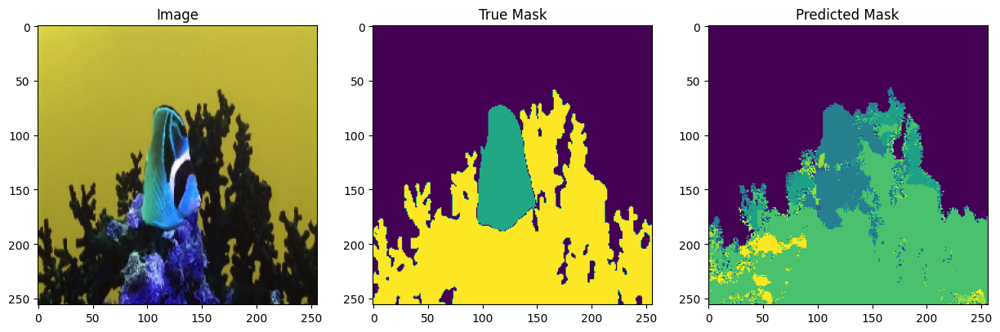

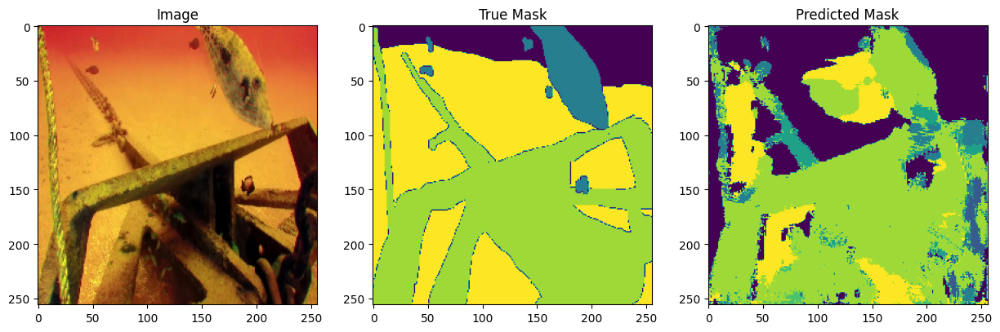

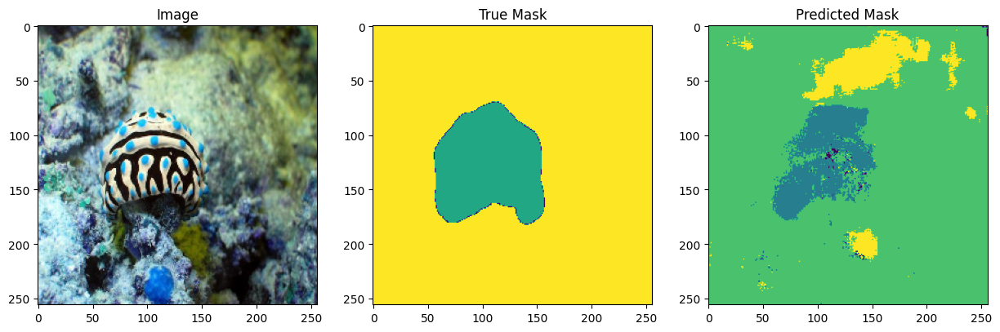

...

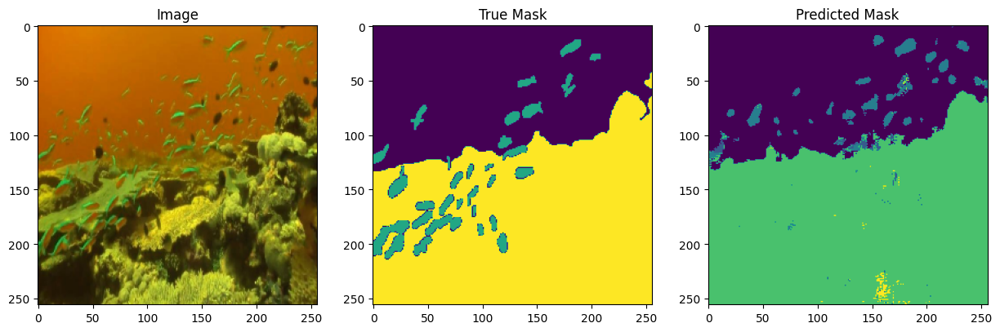

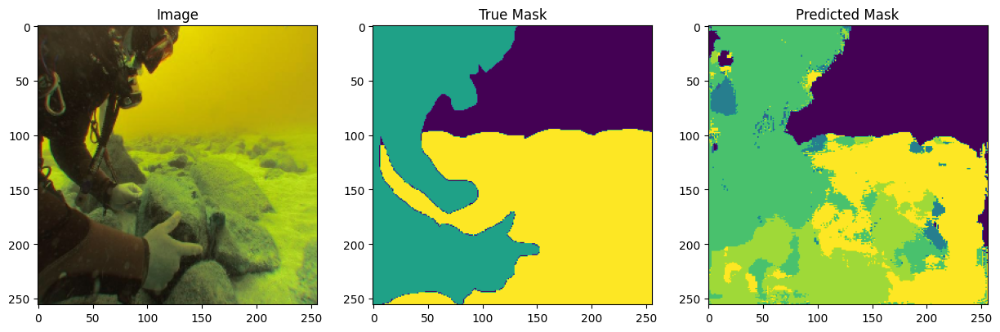

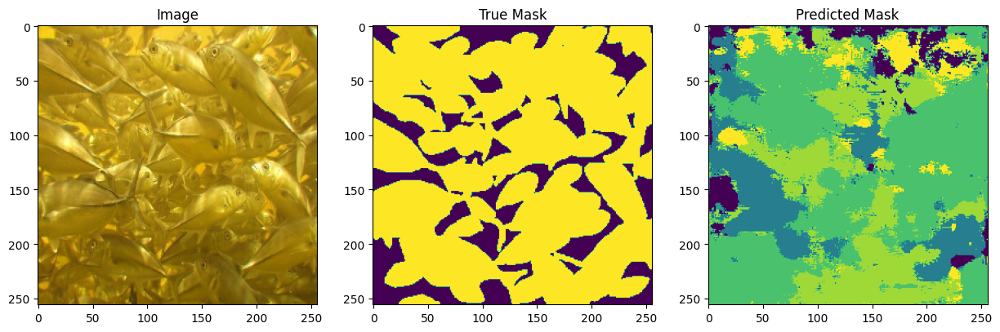

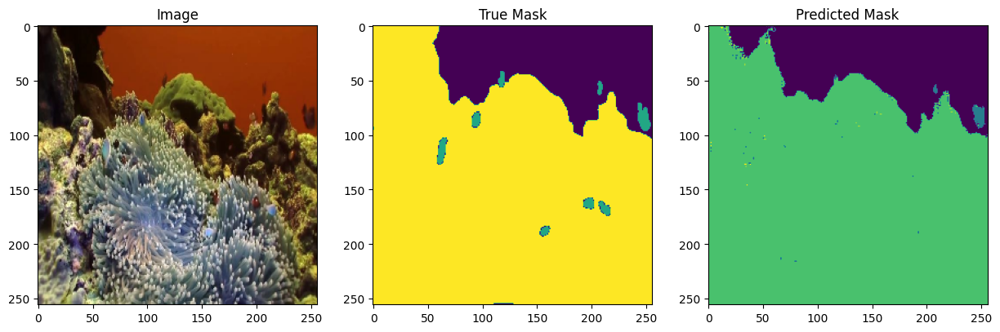

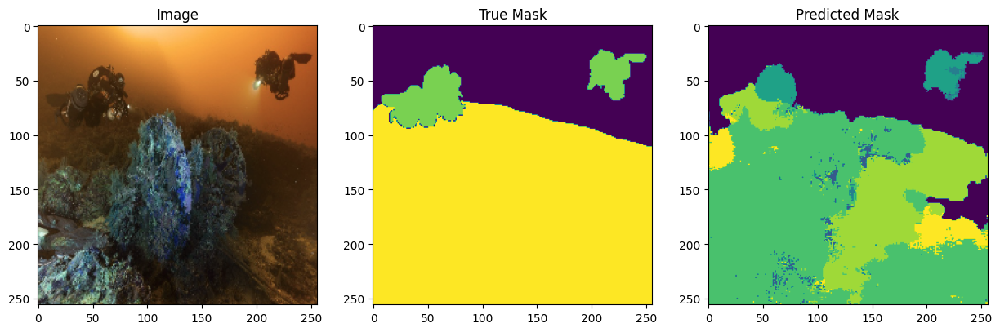

In [14]:
# Evaluate the model
loss, acc = model.model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict the masks for the test set
y_pred = model.model.predict(X_test)

# Plotting function for results (image, true mask, and predicted mask)
def plot_sample(image, mask_true, mask_pred):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title("Image")
    
    axs[1].imshow(np.argmax(mask_true, axis=2))
    axs[1].set_title("True Mask")
    
    axs[2].imshow(np.argmax(mask_pred, axis=2))
    axs[2].set_title("Predicted Mask")
    
    plt.show()

# Visualize the results
for i in range(50):
    sample_img = X_test[i]
    sample_true_mask = y_test[i]
    sample_pred_mask = y_pred[i]
    
    plot_sample(sample_img, sample_true_mask, sample_pred_mask)


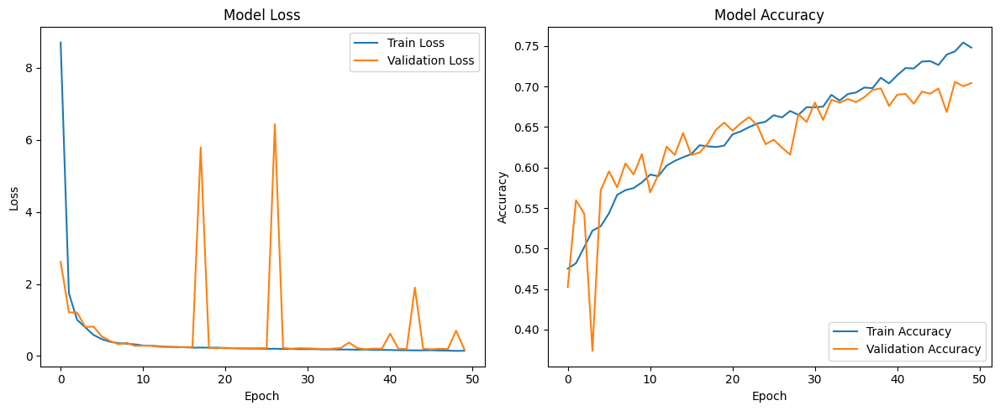

In [15]:
import matplotlib.pyplot as plt

def plot_loss_accuracy(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# Example usage
# history = model.fit(...)  # Assuming you have trained the model and history is returned
plot_loss_accuracy(history)
